# Expiration Date Recognition from ID Cards
## Moroccan OCR Project - Advanced Computer Vision

---

### Project Overview

This project implements an **Optical Character Recognition (OCR)** system specifically designed for detecting and extracting **expiration dates** from identity documents (CIN, passports, driving licenses).

### Objectives

1. **Load Real ID Card Dataset**: MIDV-500 public dataset
2. **Text Detection**: Locate text regions on ID cards
3. **OCR Recognition**: Extract text using PaddleOCR
4. **Date Extraction**: Parse and validate expiration dates

### Dataset: MIDV-500

- **15,000 real images** of identity documents
- **50 document types**: 17 ID cards, 14 passports, 13 driving licenses
- **Multiple countries** with various date formats
- **Ground truth annotations** included
- **Real-world conditions**: blur, lighting variations, angles

### Tools Used

- **PaddleOCR**: State-of-the-art OCR with multilingual support
- **OpenCV**: Image preprocessing
- **Python regex**: Date pattern extraction

---

## 1. Environment Setup

In [1]:
# Install required packages
!pip install paddlepaddle paddleocr opencv-python matplotlib numpy pillow midv500 tqdm -q
print("Packages installed successfully!")

Packages installed successfully!


In [2]:
# Core imports
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import re
import json
import glob
from datetime import datetime
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')

# PaddleOCR
from paddleocr import PaddleOCR

# MIDV-500 dataset
from midv500 import download_dataset

# For visualization
import matplotlib.patches as mpatches

print("All imports successful!")
print(f"OpenCV version: {cv2.__version__}")
print(f"NumPy version: {np.__version__}")

Checking connectivity to the model hosters, this may take a while. To bypass this check, set `DISABLE_MODEL_SOURCE_CHECK` to `True`.


All imports successful!
OpenCV version: 4.10.0
NumPy version: 2.2.6


## 2. Download MIDV-500 Dataset

MIDV-500 is a **real** public dataset containing:
- 50 types of identity documents from various countries
- 17 ID cards, 14 passports, 13 driving licenses
- Ground truth annotations for text fields
- Real-world conditions (blur, lighting, angles)

In [ ]:
DATA_DIR = "data"
MIDV_DIR = os.path.join(DATA_DIR, "midv500")

NESTED_DIR = os.path.join(MIDV_DIR, "midv500")
if os.path.exists(NESTED_DIR) and os.path.isdir(NESTED_DIR):
    MIDV_DIR = NESTED_DIR
    print(f"Dataset found at: {os.path.abspath(MIDV_DIR)}")
else:
    os.makedirs(DATA_DIR, exist_ok=True)
    print(f"Data directory: {os.path.abspath(DATA_DIR)}")

Dataset found at: c:\Users\HP\Career\MASTER ML&AI\Advanced Computer Vision ML\PROJET_Expiration date recognition (Moroccan OCR)\data\midv500\midv500


In [ ]:
existing_folders = []
if os.path.exists(MIDV_DIR):
    existing_folders = [f for f in os.listdir(MIDV_DIR) if os.path.isdir(os.path.join(MIDV_DIR, f))]

if len(existing_folders) >= 10:
    print("MIDV-500 dataset already downloaded!")
    print(f"   Found {len(existing_folders)} document types in {MIDV_DIR}")
    print("   Skipping download...")
else:
    print("Downloading MIDV-500 dataset...")
    print("   This contains REAL ID card images from various countries.")
    print("   Please wait, this may take 5-10 minutes...\n")

    try:
        download_dataset(download_dir=os.path.join(DATA_DIR, "midv500"), dataset_name="midv500")
        # Update MIDV_DIR after download
        MIDV_DIR = os.path.join(DATA_DIR, "midv500", "midv500")
        print("\nMIDV-500 dataset downloaded successfully!")
    except Exception as e:
        print(f"\nDownload error: {e}")
        print("\nManual download instructions:")
        print("1. Go to: ftp://smartengines.com/midv-500/")
        print("2. Download the document folders you need")
        print(f"3. Extract to: {os.path.abspath(MIDV_DIR)}")

MIDV-500 dataset already downloaded!
   Found 50 document types in data\midv500\midv500
   Skipping download...


In [5]:
# Explore downloaded dataset structure
print("Dataset Structure:")
print("=" * 50)

document_types = []
total_images = 0

if os.path.exists(MIDV_DIR):
    for doc_folder in sorted(os.listdir(MIDV_DIR)):
        doc_path = os.path.join(MIDV_DIR, doc_folder)
        if os.path.isdir(doc_path):
            # Count images in this document type
            images = glob.glob(os.path.join(doc_path, "**/*.tif"), recursive=True)
            images += glob.glob(os.path.join(doc_path, "**/*.jpg"), recursive=True)
            images += glob.glob(os.path.join(doc_path, "**/*.png"), recursive=True)
            
            if images:
                document_types.append({
                    'name': doc_folder,
                    'path': doc_path,
                    'count': len(images),
                    'images': images
                })
                total_images += len(images)
                print(f"   {doc_folder}: {len(images)} images")

print(f"\nTotal: {len(document_types)} document types, {total_images} images")

if not document_types:
    print("\nNo images found. Please check the download or manual extraction.")

Dataset Structure:
   01_alb_id: 301 images
   02_aut_drvlic_new: 301 images
   03_aut_id_old: 301 images
   04_aut_id: 301 images
   05_aze_passport: 301 images
   06_bra_passport: 301 images
   07_chl_id: 301 images
   08_chn_homereturn: 301 images
   09_chn_id: 301 images
   10_cze_id: 301 images
   11_cze_passport: 301 images
   12_deu_drvlic_new: 301 images
   13_deu_drvlic_old: 301 images
   14_deu_id_new: 301 images
   15_deu_id_old: 301 images
   16_deu_passport_new: 301 images
   17_deu_passport_old: 301 images
   18_dza_passport: 301 images
   19_esp_drvlic: 301 images
   20_esp_id_new: 301 images
   21_esp_id_old: 301 images
   22_est_id: 301 images
   23_fin_drvlic: 301 images
   24_fin_id: 301 images
   25_grc_passport: 301 images
   26_hrv_drvlic: 301 images
   27_hrv_passport: 301 images
   28_hun_passport: 301 images
   29_irn_drvlic: 301 images
   30_ita_drvlic: 301 images
   31_jpn_drvlic: 301 images
   32_lva_passport: 301 images
   33_mac_id: 301 images
   34_mda_pa

In [6]:
# Load sample images from the dataset
def load_dataset_images(document_types, max_per_type=5, max_total=30):
    """
    Load sample images from MIDV-500 dataset.
    
    Args:
        document_types: List of document type info dicts
        max_per_type: Maximum images to load per document type
        max_total: Maximum total images to load
    
    Returns:
        List of image info dicts
    """
    all_images = []
    
    for doc_type in document_types:
        images = doc_type['images'][:max_per_type]
        
        for img_path in images:
            if len(all_images) >= max_total:
                break
                
            # Load image
            img = cv2.imread(img_path)
            if img is not None:
                all_images.append({
                    'path': img_path,
                    'name': doc_type['name'],
                    'image': img,
                    'filename': os.path.basename(img_path)
                })
        
        if len(all_images) >= max_total:
            break
    
    return all_images

# Load images
print("Loading sample images from dataset...")
dataset_images = load_dataset_images(document_types, max_per_type=3, max_total=20)
print(f"Loaded {len(dataset_images)} real ID card images")

Loading sample images from dataset...
Loaded 20 real ID card images


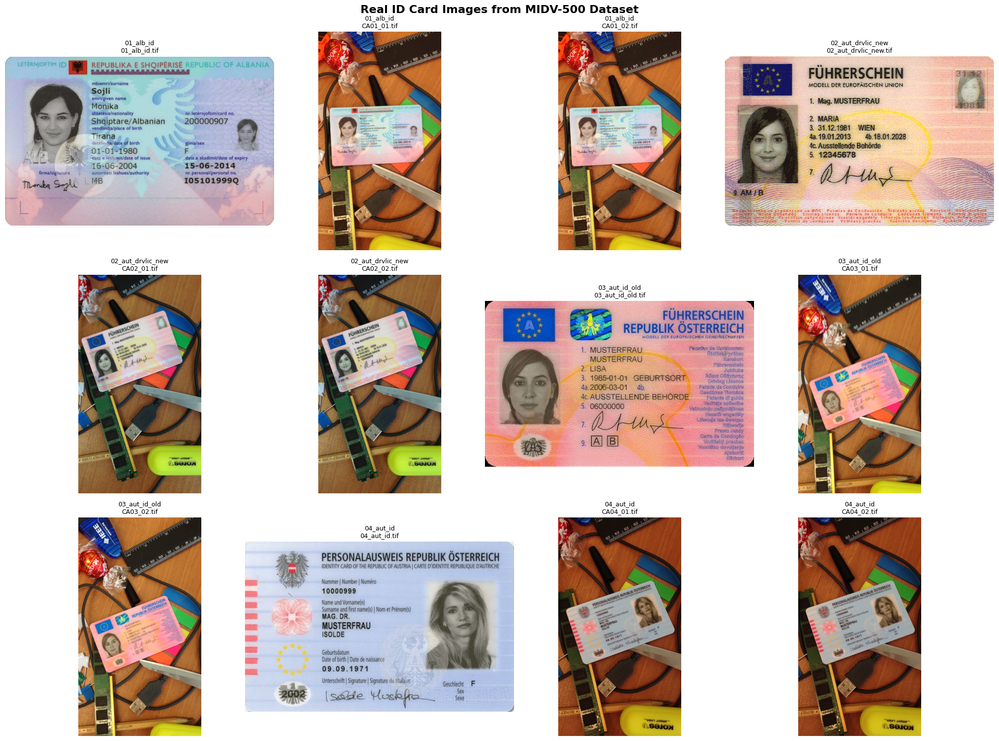

In [7]:
# Visualize sample images from MIDV-500
n_samples = min(12, len(dataset_images))
rows = (n_samples + 3) // 4

fig, axes = plt.subplots(rows, 4, figsize=(20, 5*rows))
fig.suptitle('Real ID Card Images from MIDV-500 Dataset', fontsize=16, fontweight='bold')

axes = axes.flatten() if n_samples > 4 else [axes] if n_samples == 1 else axes

for idx in range(len(axes)):
    if idx < len(dataset_images):
        img_info = dataset_images[idx]
        img_rgb = cv2.cvtColor(img_info['image'], cv2.COLOR_BGR2RGB)
        axes[idx].imshow(img_rgb)
        axes[idx].set_title(f"{img_info['name']}\n{img_info['filename']}", fontsize=9)
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

## 3. Initialize PaddleOCR

PaddleOCR is a powerful OCR toolkit that supports:
- 80+ languages including Arabic, French, English
- Text detection and recognition
- High accuracy on various document types

In [8]:
# Initialize PaddleOCR
print("Initializing PaddleOCR...")
print("   (First run will download models - please wait)")

# Initialize with default settings (new API - minimal parameters)
ocr = PaddleOCR(lang='en')

print("PaddleOCR initialized successfully!")

Initializing PaddleOCR...
   (First run will download models - please wait)


Creating model: ('PP-LCNet_x1_0_doc_ori', None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `C:\Users\HP\.paddlex\official_models\PP-LCNet_x1_0_doc_ori`.
Creating model: ('UVDoc', None)
Using official model (UVDoc), the model files will be automatically downloaded and saved in `C:\Users\HP\.paddlex\official_models\UVDoc`.
Fetching 6 files: 100%|██████████| 6/6 [00:06<00:00,  1.09s/it]
Creating model: ('PP-LCNet_x1_0_textline_ori', None)
Using official model (PP-LCNet_x1_0_textline_ori), the model files will be automatically downloaded and saved in `C:\Users\HP\.paddlex\official_models\PP-LCNet_x1_0_textline_ori`.
Fetching 6 files: 100%|██████████| 6/6 [00:01<00:00,  4.43it/s]
Creating model: ('PP-OCRv5_server_det', None)
Using official model (PP-OCRv5_server_det), the model files will be automatically downloaded and saved in `C:\Users\HP\.paddlex\official_models\PP-OCRv5_server_det`.
Fetching 6 files: 100%|██████████| 6/6 [00:12<0

PaddleOCR initialized successfully!


## 4. OCR Processing Pipeline

In [11]:
class IDCardOCR:
    """
    Complete OCR pipeline for ID card processing and expiration date extraction.
    
    Features:
    - Text detection using PaddleOCR
    - Date pattern recognition (multiple formats)
    - Expiration date extraction with context awareness
    - Visualization tools
    """
    
    def __init__(self, ocr_engine):
        self.ocr = ocr_engine
        
        # Common date patterns (regex)
        self.date_patterns = [
            # DD/MM/YYYY or DD-MM-YYYY or DD.MM.YYYY
            r'\b(\d{1,2})[/\-\.](\d{1,2})[/\-\.](\d{4})\b',
            # DD/MM/YY
            r'\b(\d{1,2})[/\-\.](\d{1,2})[/\-\.](\d{2})\b',
            # YYYY/MM/DD or YYYY-MM-DD
            r'\b(\d{4})[/\-\.](\d{1,2})[/\-\.](\d{1,2})\b',
            # DD MMM YYYY (e.g., 18 MAR 2029)
            r'\b(\d{1,2})\s+(JAN|FEB|MAR|APR|MAY|JUN|JUL|AUG|SEP|OCT|NOV|DEC)[A-Z]*\s+(\d{4})\b',
            # DD MMM YY
            r'\b(\d{1,2})\s+(JAN|FEB|MAR|APR|MAY|JUN|JUL|AUG|SEP|OCT|NOV|DEC)[A-Z]*\s+(\d{2})\b',
            # DDMMYYYY (no separator)
            r'\b(\d{2})(\d{2})(\d{4})\b',
        ]
        
        # Keywords that indicate expiration date (multilingual)
        self.expiry_keywords = [
            # English
            'expir', 'expiry', 'exp', 'valid until', 'valid thru', 'validity',
            # French
            'valable', 'validite', 'expire', 'jusqu', 'fin de validite',
            # German
            'gultig', 'ablauf',
            # Spanish
            'valido', 'vencimiento', 'caducidad',
            # Common codes
            '4b', 'date of expiry', 'date of exp'
        ]
    
    def preprocess_image(self, image):
        """Preprocess image for better OCR results."""
        # Convert to grayscale
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray = image.copy()
        
        # Denoise
        denoised = cv2.fastNlMeansDenoising(gray, None, 10, 7, 21)
        
        # Increase contrast using CLAHE
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        enhanced = clahe.apply(denoised)
        
        # Convert back to BGR for PaddleOCR
        enhanced_bgr = cv2.cvtColor(enhanced, cv2.COLOR_GRAY2BGR)
        
        return enhanced_bgr, gray, enhanced
    
    def extract_text(self, image):
        """Extract all text from image using PaddleOCR."""
        # Use predict() method (new API) instead of deprecated ocr()
        result = self.ocr.predict(image)
        
        extracted = []
        if result and len(result) > 0:
            # Handle different result formats
            ocr_result = result[0] if isinstance(result, list) else result
            
            # Check if result has 'rec_texts' format (new API)
            if hasattr(ocr_result, 'keys') or isinstance(ocr_result, dict):
                # New API format: dict with 'rec_texts', 'rec_scores', 'dt_polys'
                if 'rec_texts' in ocr_result:
                    texts = ocr_result.get('rec_texts', [])
                    scores = ocr_result.get('rec_scores', [])
                    polys = ocr_result.get('dt_polys', [])
                    
                    for i, text in enumerate(texts):
                        bbox = polys[i].tolist() if i < len(polys) else [[0,0],[0,0],[0,0],[0,0]]
                        confidence = scores[i] if i < len(scores) else 0.0
                        extracted.append({
                            'bbox': bbox,
                            'text': text,
                            'confidence': float(confidence)
                        })
            elif isinstance(ocr_result, list):
                # Old API format: list of [bbox, (text, confidence)]
                for line in ocr_result:
                    if line is None:
                        continue
                    if isinstance(line, list) and len(line) >= 2:
                        bbox = line[0]
                        text = line[1][0] if isinstance(line[1], tuple) else str(line[1])
                        confidence = line[1][1] if isinstance(line[1], tuple) else 0.5
                        extracted.append({
                            'bbox': bbox,
                            'text': text,
                            'confidence': float(confidence)
                        })
        
        return extracted
    
    def find_dates(self, text):
        """Find all date patterns in text."""
        dates = []
        
        for pattern in self.date_patterns:
            matches = re.finditer(pattern, text, re.IGNORECASE)
            for match in matches:
                dates.append({
                    'date_str': match.group(0),
                    'start': match.start(),
                    'end': match.end()
                })
        
        return dates
    
    def is_expiry_context(self, text):
        """Check if text contains expiry-related keywords."""
        text_lower = text.lower()
        return any(keyword in text_lower for keyword in self.expiry_keywords)
    
    def extract_expiry_date(self, image):
        """
        Main method: Extract expiration date from ID card image.
        
        Returns:
            dict: Contains expiry_date, all_text, all_dates, visualization_data
        """
        # Preprocess
        preprocessed, gray, enhanced = self.preprocess_image(image)
        
        # Extract text from original
        text_results = self.extract_text(image)
        
        # Also try on enhanced image
        text_results_enhanced = self.extract_text(preprocessed)
        
        # Combine results (remove duplicates)
        all_texts = text_results + text_results_enhanced
        seen_texts = set()
        unique_results = []
        for item in all_texts:
            text_key = item['text'].strip().lower()
            if text_key not in seen_texts and len(item['text'].strip()) > 0:
                seen_texts.add(text_key)
                unique_results.append(item)
        
        # Find expiry date
        expiry_date = None
        expiry_confidence = 0
        all_dates = []
        
        for item in unique_results:
            text = item['text']
            dates = self.find_dates(text)
            
            for date_info in dates:
                date_info['source_text'] = text
                date_info['is_expiry'] = self.is_expiry_context(text)
                date_info['confidence'] = item['confidence']
                date_info['bbox'] = item['bbox']
                all_dates.append(date_info)
                
                # Prioritize dates with expiry context
                if date_info['is_expiry'] and item['confidence'] > expiry_confidence:
                    expiry_date = date_info['date_str']
                    expiry_confidence = item['confidence']
        
        # If no expiry context found, take the last date (often expiry)
        if expiry_date is None and all_dates:
            # Sort by position (bottom of document usually has expiry)
            sorted_dates = sorted(all_dates, key=lambda x: np.mean([p[1] for p in x['bbox']]) if x['bbox'] else 0)
            if sorted_dates:
                expiry_date = sorted_dates[-1]['date_str']
                expiry_confidence = sorted_dates[-1]['confidence']
        
        return {
            'expiry_date': expiry_date,
            'expiry_confidence': expiry_confidence,
            'all_text': unique_results,
            'all_dates': all_dates,
            'preprocessed_images': {
                'gray': gray,
                'enhanced': enhanced
            }
        }
    
    def visualize_results(self, image, results, title="OCR Results"):
        """Visualize OCR results with bounding boxes."""
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        fig.suptitle(f'{title}', fontsize=14, fontweight='bold')
        
        # Original image
        img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        axes[0].imshow(img_rgb)
        axes[0].set_title('Original Image')
        axes[0].axis('off')
        
        # Image with text detections
        axes[1].imshow(img_rgb)
        
        for item in results['all_text']:
            bbox = item['bbox']
            if bbox and len(bbox) >= 4:
                bbox = np.array(bbox).astype(int)
                
                # Determine color based on content
                if self.is_expiry_context(item['text']):
                    color = 'green'
                    linewidth = 3
                elif self.find_dates(item['text']):
                    color = 'orange'
                    linewidth = 2
                else:
                    color = 'blue'
                    linewidth = 1
                
                # Draw polygon
                polygon = plt.Polygon(bbox, fill=False, edgecolor=color, linewidth=linewidth)
                axes[1].add_patch(polygon)
        
        axes[1].set_title('Text Detection')
        axes[1].axis('off')
        
        # Add legend
        legend_elements = [
            mpatches.Patch(facecolor='white', edgecolor='green', label='Expiry Related'),
            mpatches.Patch(facecolor='white', edgecolor='orange', label='Date Found'),
            mpatches.Patch(facecolor='white', edgecolor='blue', label='Other Text')
        ]
        axes[1].legend(handles=legend_elements, loc='upper right', fontsize=8)
        
        # Extracted information
        axes[2].axis('off')
        
        info_text = f"""EXTRACTION RESULTS
{'='*35}

DETECTED EXPIRY DATE:
   {results['expiry_date'] or 'Not found'}
   Confidence: {results['expiry_confidence']*100:.1f}%

{'='*35}
ALL DATES FOUND:
"""
        
        for i, date_info in enumerate(results['all_dates'][:5]):
            marker = "->" if date_info.get('is_expiry') else "  "
            info_text += f"\n{marker} {date_info['date_str']}"
            if date_info.get('is_expiry'):
                info_text += " (EXPIRY)"
        
        info_text += f"\n\n{'='*35}\nDETECTED TEXT ({len(results['all_text'])} regions):\n"
        
        for i, item in enumerate(results['all_text'][:8]):
            text = item['text'][:30] + "..." if len(item['text']) > 30 else item['text']
            info_text += f"\n* {text}"
        
        if len(results['all_text']) > 8:
            info_text += f"\n... +{len(results['all_text'])-8} more"
        
        axes[2].text(0.05, 0.95, info_text, transform=axes[2].transAxes,
                    fontsize=9, verticalalignment='top', fontfamily='monospace',
                    bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))
        axes[2].set_title('Extracted Information')
        
        plt.tight_layout()
        plt.show()
        
        return fig

# Initialize OCR pipeline
id_ocr = IDCardOCR(ocr)
print("ID Card OCR Pipeline initialized!")

ID Card OCR Pipeline initialized!


## 5. Process Real ID Cards from MIDV-500

In [12]:
# Process all loaded ID card images
print("Processing Real ID Cards from MIDV-500...")
print("=" * 60)

all_results = []

for i, img_info in enumerate(tqdm(dataset_images, desc="Processing")):
    # Extract expiry date
    results = id_ocr.extract_expiry_date(img_info['image'])
    results['image_info'] = img_info
    all_results.append(results)

print(f"\nProcessed {len(all_results)} images")

Processing Real ID Cards from MIDV-500...


Processing: 100%|██████████| 20/20 [1:30:42<00:00, 272.10s/it] 


Processed 20 images


In [13]:
# Display results summary
print("\nEXTRACTION RESULTS SUMMARY")
print("=" * 70)

dates_found = 0
expiry_found = 0

print(f"\n{'Document Type':<30} {'Expiry Date':<20} {'Confidence':<12} {'Dates Found'}")
print("-" * 70)

for results in all_results:
    img_info = results['image_info']
    expiry = results['expiry_date'] or "Not detected"
    conf = f"{results['expiry_confidence']*100:.1f}%" if results['expiry_date'] else "-"
    n_dates = len(results['all_dates'])
    
    if results['expiry_date']:
        expiry_found += 1
    if n_dates > 0:
        dates_found += 1
    
    print(f"{img_info['name']:<30} {expiry:<20} {conf:<12} {n_dates}")

print("-" * 70)
print(f"\nStatistics:")
print(f"   * Images with dates detected: {dates_found}/{len(all_results)} ({dates_found/len(all_results)*100:.1f}%)")
print(f"   * Images with expiry date: {expiry_found}/{len(all_results)} ({expiry_found/len(all_results)*100:.1f}%)")


EXTRACTION RESULTS SUMMARY

Document Type                  Expiry Date          Confidence   Dates Found
----------------------------------------------------------------------
01_alb_id                      16-06-2004           99.9%        3
01_alb_id                      15-06-2014           99.9%        3
01_alb_id                      15-06-2014           100.0%       3
02_aut_drvlic_new              18.01.2028           98.6%        6
02_aut_drvlic_new              18.01.2028           98.9%        7
02_aut_drvlic_new              18.01.2028           97.0%        4
03_aut_id_old                  06000000             95.0%        5
03_aut_id_old                  46260550             52.9%        3
03_aut_id_old                  06000000             99.5%        6
04_aut_id                      09.09.1971           99.9%        2
04_aut_id                      09.09.1971           99.7%        2
04_aut_id                      09.09.1971           99.9%        2
05_aze_passport    


Detailed Analysis of Sample Images


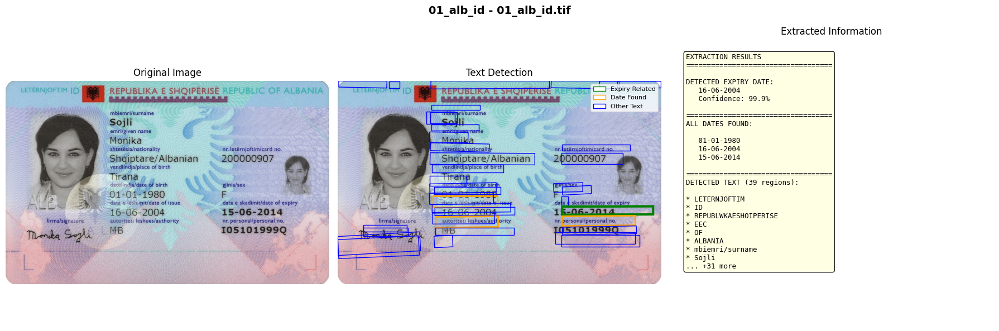

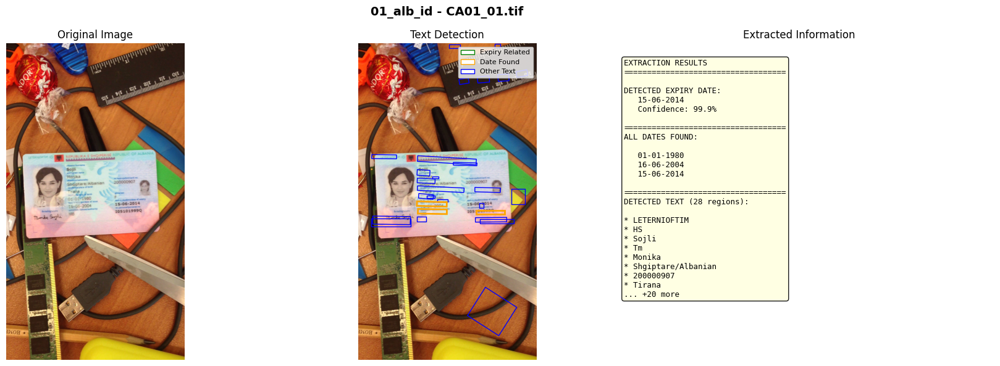

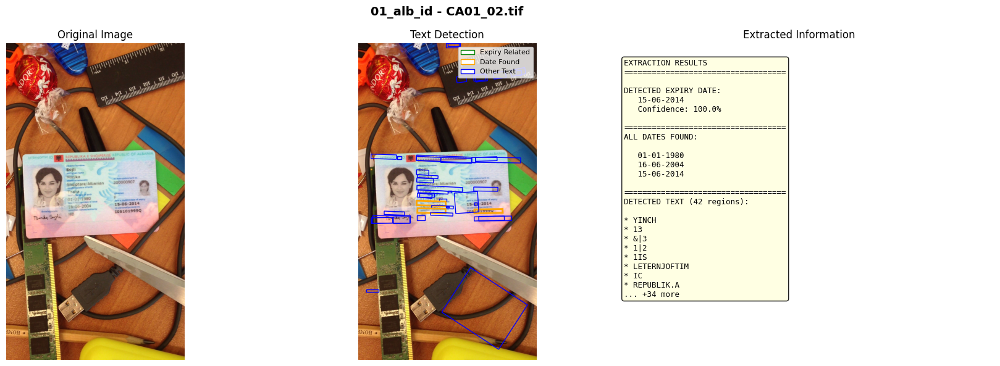

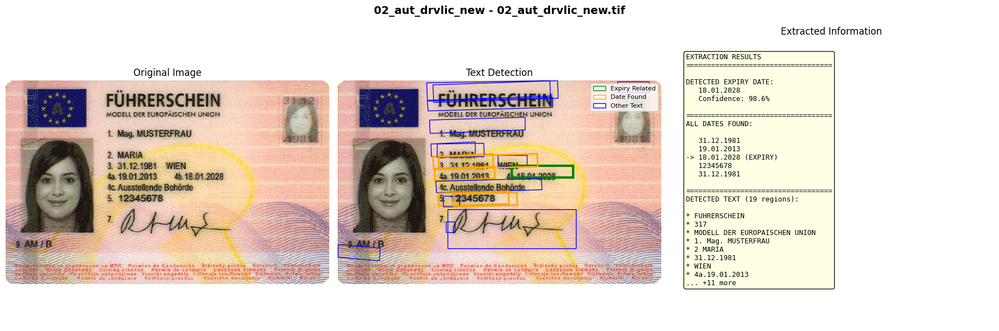

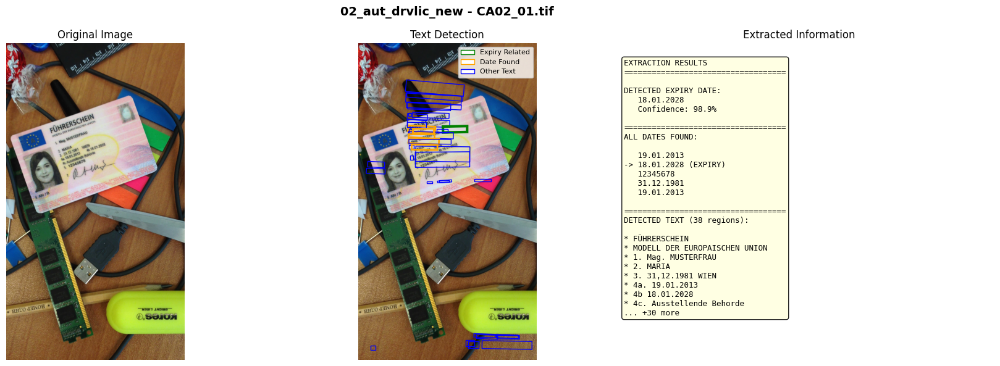

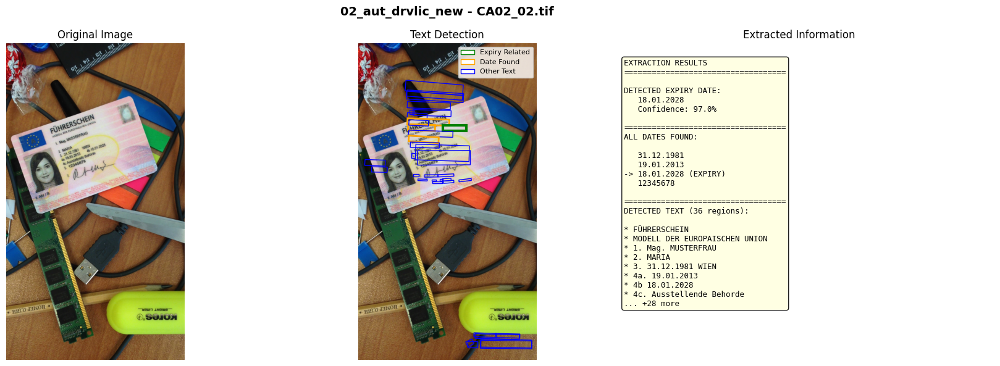

In [14]:
# Visualize detailed results for selected images
print("\nDetailed Analysis of Sample Images")
print("=" * 60)

# Show results for first 6 images with detected dates
shown = 0
for results in all_results:
    if shown >= 6:
        break
    
    img_info = results['image_info']
    
    # Show visualization
    id_ocr.visualize_results(
        img_info['image'],
        results,
        title=f"{img_info['name']} - {img_info['filename']}"
    )
    shown += 1

## 6. Preprocessing Pipeline Visualization

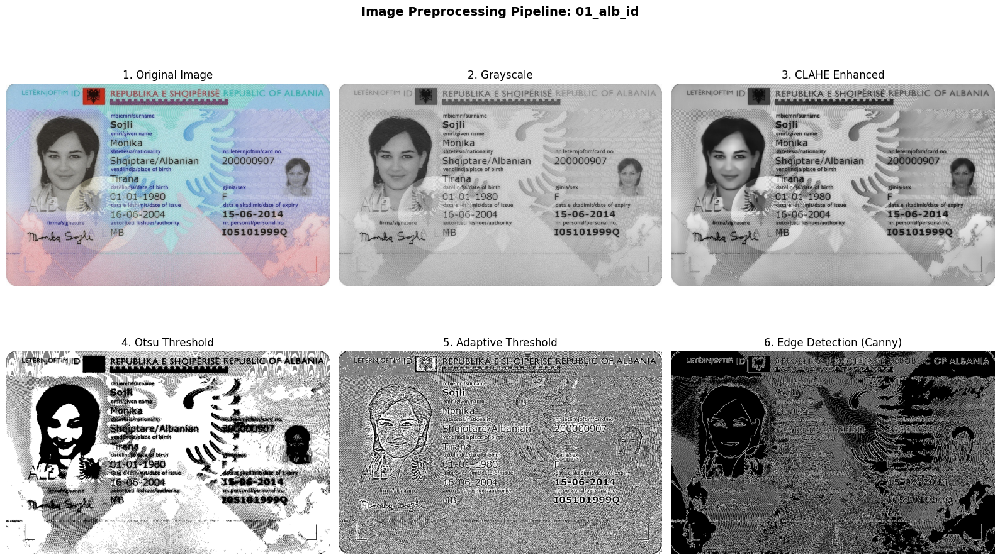

In [15]:
# Show preprocessing steps for a sample image
if dataset_images:
    sample_img = dataset_images[0]
    image = sample_img['image']
    results = all_results[0]
    
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    fig.suptitle(f'Image Preprocessing Pipeline: {sample_img["name"]}', fontsize=14, fontweight='bold')
    
    # Original
    axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title('1. Original Image')
    axes[0, 0].axis('off')
    
    # Grayscale
    axes[0, 1].imshow(results['preprocessed_images']['gray'], cmap='gray')
    axes[0, 1].set_title('2. Grayscale')
    axes[0, 1].axis('off')
    
    # Enhanced (CLAHE)
    axes[0, 2].imshow(results['preprocessed_images']['enhanced'], cmap='gray')
    axes[0, 2].set_title('3. CLAHE Enhanced')
    axes[0, 2].axis('off')
    
    # Binary threshold
    _, binary = cv2.threshold(results['preprocessed_images']['enhanced'], 0, 255, 
                              cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    axes[1, 0].imshow(binary, cmap='gray')
    axes[1, 0].set_title('4. Otsu Threshold')
    axes[1, 0].axis('off')
    
    # Adaptive threshold
    adaptive = cv2.adaptiveThreshold(results['preprocessed_images']['gray'], 255,
                                      cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY, 11, 2)
    axes[1, 1].imshow(adaptive, cmap='gray')
    axes[1, 1].set_title('5. Adaptive Threshold')
    axes[1, 1].axis('off')
    
    # Edge detection
    edges = cv2.Canny(results['preprocessed_images']['enhanced'], 50, 150)
    axes[1, 2].imshow(edges, cmap='gray')
    axes[1, 2].set_title('6. Edge Detection (Canny)')
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("No images loaded to show preprocessing")

## 7. Date Parser & Validation

In [16]:
class DateParser:
    """
    Parse and normalize various date formats found on ID documents.
    """
    
    MONTH_MAP = {
        'JAN': 1, 'FEB': 2, 'MAR': 3, 'APR': 4,
        'MAY': 5, 'JUN': 6, 'JUL': 7, 'AUG': 8,
        'SEP': 9, 'OCT': 10, 'NOV': 11, 'DEC': 12,
        'JANUARY': 1, 'FEBRUARY': 2, 'MARCH': 3, 'APRIL': 4,
        'JUNE': 6, 'JULY': 7, 'AUGUST': 8, 'SEPTEMBER': 9,
        'OCTOBER': 10, 'NOVEMBER': 11, 'DECEMBER': 12
    }
    
    @staticmethod
    def parse(date_str):
        """Parse date string to datetime object."""
        if not date_str:
            return None
        
        date_str = date_str.strip()
        
        # Try different formats
        formats = [
            '%d/%m/%Y', '%d-%m-%Y', '%d.%m.%Y',  # DD/MM/YYYY
            '%d/%m/%y', '%d-%m-%y', '%d.%m.%y',  # DD/MM/YY
            '%Y/%m/%d', '%Y-%m-%d', '%Y.%m.%d',  # YYYY/MM/DD
            '%m/%d/%Y', '%m-%d-%Y',              # MM/DD/YYYY (US)
        ]
        
        for fmt in formats:
            try:
                return datetime.strptime(date_str, fmt)
            except ValueError:
                continue
        
        # Try month name format (e.g., "18 MAR 2029")
        match = re.match(r'(\d{1,2})\s+([A-Za-z]+)\s+(\d{2,4})', date_str, re.IGNORECASE)
        if match:
            day, month_str, year = match.groups()
            month = DateParser.MONTH_MAP.get(month_str.upper())
            if month:
                year = int(year)
                if year < 100:
                    year += 2000 if year < 50 else 1900
                try:
                    return datetime(year, month, int(day))
                except:
                    pass
        
        return None
    
    @staticmethod
    def is_expired(date_str):
        """Check if date is expired."""
        parsed = DateParser.parse(date_str)
        if parsed:
            return parsed < datetime.now()
        return None
    
    @staticmethod
    def days_until_expiry(date_str):
        """Calculate days until expiry."""
        parsed = DateParser.parse(date_str)
        if parsed:
            delta = parsed - datetime.now()
            return delta.days
        return None
    
    @staticmethod
    def format_date(date_str, output_format='%d/%m/%Y'):
        """Normalize date to standard format."""
        parsed = DateParser.parse(date_str)
        if parsed:
            return parsed.strftime(output_format)
        return date_str

# Test date parser with detected dates
print("DATE PARSING & VALIDATION")
print("=" * 50)

parser = DateParser()

# Get all unique detected dates
all_detected_dates = set()
for results in all_results:
    for date_info in results['all_dates']:
        all_detected_dates.add(date_info['date_str'])

print(f"\nFound {len(all_detected_dates)} unique dates in dataset:\n")

for date_str in list(all_detected_dates)[:10]:
    parsed = parser.parse(date_str)
    is_exp = parser.is_expired(date_str)
    days = parser.days_until_expiry(date_str)
    
    if parsed:
        status = "EXPIRED" if is_exp else f"Valid ({days} days left)"
        normalized = parser.format_date(date_str)
        print(f"{date_str:<20} -> {normalized:<15} {status}")
    else:
        print(f"{date_str:<20} -> Could not parse")

DATE PARSING & VALIDATION

Found 21 unique dates in dataset:

09.09.1971           -> 09/09/1971      EXPIRED
21 FEB 1982          -> 21/02/1982      EXPIRED
19650101             -> Could not parse
01-01-1980           -> 01/01/1980      EXPIRED
18.01.2028           -> 18/01/2028      Valid (750 days left)
02.08.2013           -> 02/08/2013      EXPIRED
12345678             -> Could not parse
46260550             -> Could not parse
4.19.01              -> Could not parse
10000999             -> Could not parse


## 8. Analysis by Document Type

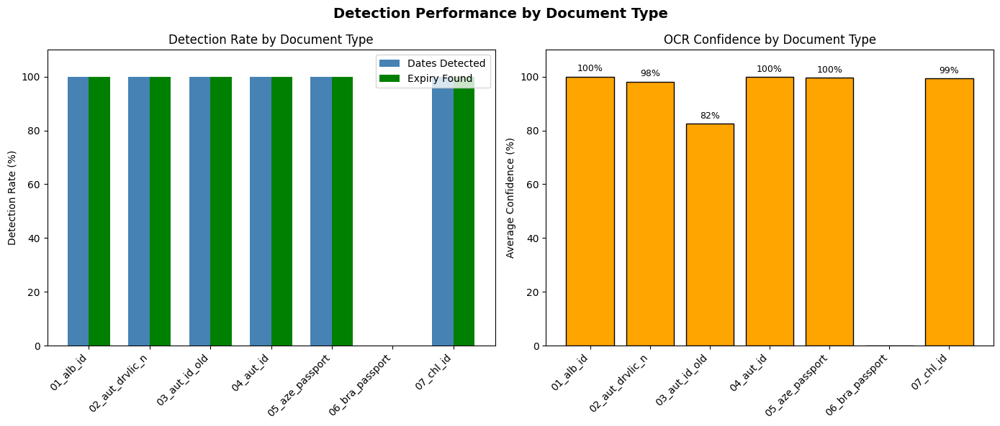

In [17]:
# Analyze results by document type
type_stats = defaultdict(lambda: {'total': 0, 'with_dates': 0, 'with_expiry': 0, 'avg_confidence': []})

for results in all_results:
    doc_type = results['image_info']['name']
    type_stats[doc_type]['total'] += 1
    
    if results['all_dates']:
        type_stats[doc_type]['with_dates'] += 1
    
    if results['expiry_date']:
        type_stats[doc_type]['with_expiry'] += 1
        type_stats[doc_type]['avg_confidence'].append(results['expiry_confidence'])

# Create visualization
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Detection Performance by Document Type', fontsize=14, fontweight='bold')

# Prepare data
doc_types = list(type_stats.keys())
detection_rates = [type_stats[t]['with_dates']/type_stats[t]['total']*100 for t in doc_types]
expiry_rates = [type_stats[t]['with_expiry']/type_stats[t]['total']*100 for t in doc_types]

# Bar chart
x = np.arange(len(doc_types))
width = 0.35

bars1 = axes[0].bar(x - width/2, detection_rates, width, label='Dates Detected', color='steelblue')
bars2 = axes[0].bar(x + width/2, expiry_rates, width, label='Expiry Found', color='green')

axes[0].set_ylabel('Detection Rate (%)')
axes[0].set_title('Detection Rate by Document Type')
axes[0].set_xticks(x)
axes[0].set_xticklabels([t[:15] for t in doc_types], rotation=45, ha='right')
axes[0].legend()
axes[0].set_ylim([0, 110])

# Confidence chart
avg_confs = []
for t in doc_types:
    confs = type_stats[t]['avg_confidence']
    avg_confs.append(np.mean(confs) * 100 if confs else 0)

bars3 = axes[1].bar(doc_types, avg_confs, color='orange', edgecolor='black')
axes[1].set_ylabel('Average Confidence (%)')
axes[1].set_title('OCR Confidence by Document Type')
axes[1].set_xticklabels([t[:15] for t in doc_types], rotation=45, ha='right')
axes[1].set_ylim([0, 110])

# Add value labels
for bar, val in zip(bars3, avg_confs):
    if val > 0:
        axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2,
                    f'{val:.0f}%', ha='center', fontsize=9)

plt.tight_layout()
plt.show()

## 9. Complete Demo Function


ID CARD ANALYSIS

Image: Direct input
   Size: 1040 x 653 pixels

Running OCR...

----------------------------------------
RESULTS
----------------------------------------

Expiry Date: 16-06-2004
   Confidence: 99.9%
   Status: EXPIRED (7866 days ago)

Text regions detected: 39
Dates found: 3

   All dates:
      01-01-1980
      16-06-2004
      15-06-2014


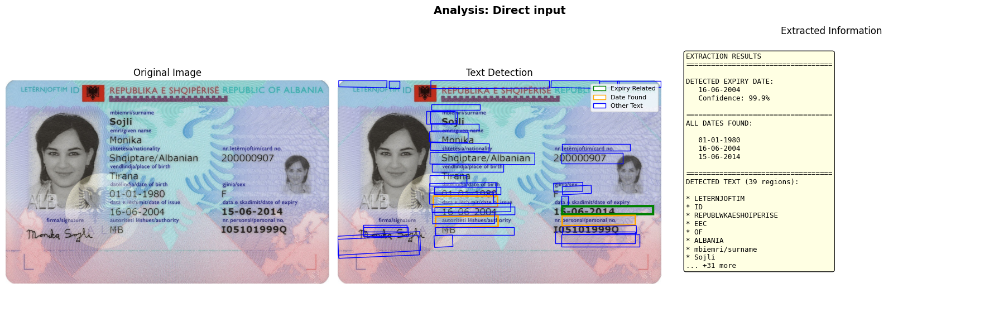

In [18]:
def analyze_id_card(image_path_or_array, ocr_pipeline, show_viz=True):
    """
    Complete analysis of an ID card image.
    
    Args:
        image_path_or_array: Path to image or numpy array
        ocr_pipeline: IDCardOCR instance
        show_viz: Whether to display visualization
    
    Returns:
        dict: Complete analysis results
    """
    print("\n" + "=" * 60)
    print("ID CARD ANALYSIS")
    print("=" * 60)
    
    # Load image
    if isinstance(image_path_or_array, str):
        image = cv2.imread(image_path_or_array)
        filename = os.path.basename(image_path_or_array)
    else:
        image = image_path_or_array
        filename = "Direct input"
    
    if image is None:
        print("Error: Could not load image")
        return None
    
    print(f"\nImage: {filename}")
    print(f"   Size: {image.shape[1]} x {image.shape[0]} pixels")
    
    # Extract information
    print("\nRunning OCR...")
    results = ocr_pipeline.extract_expiry_date(image)
    
    # Display results
    print("\n" + "-" * 40)
    print("RESULTS")
    print("-" * 40)
    
    expiry = results['expiry_date']
    print(f"\nExpiry Date: {expiry or 'Not detected'}")
    
    if expiry:
        print(f"   Confidence: {results['expiry_confidence']*100:.1f}%")
        
        is_expired = DateParser.is_expired(expiry)
        days_left = DateParser.days_until_expiry(expiry)
        
        if is_expired is not None:
            if is_expired:
                print(f"   Status: EXPIRED ({abs(days_left)} days ago)")
            else:
                print(f"   Status: VALID ({days_left} days remaining)")
    
    print(f"\nText regions detected: {len(results['all_text'])}")
    print(f"Dates found: {len(results['all_dates'])}")
    
    if results['all_dates']:
        print("\n   All dates:")
        for d in results['all_dates']:
            marker = "->" if d.get('is_expiry') else "  "
            print(f"   {marker} {d['date_str']}")
    
    # Show visualization
    if show_viz:
        ocr_pipeline.visualize_results(image, results, title=f"Analysis: {filename}")
    
    return results

# Demo on a sample image
if dataset_images:
    analyze_id_card(dataset_images[0]['image'], id_ocr)

## 10. Performance Summary

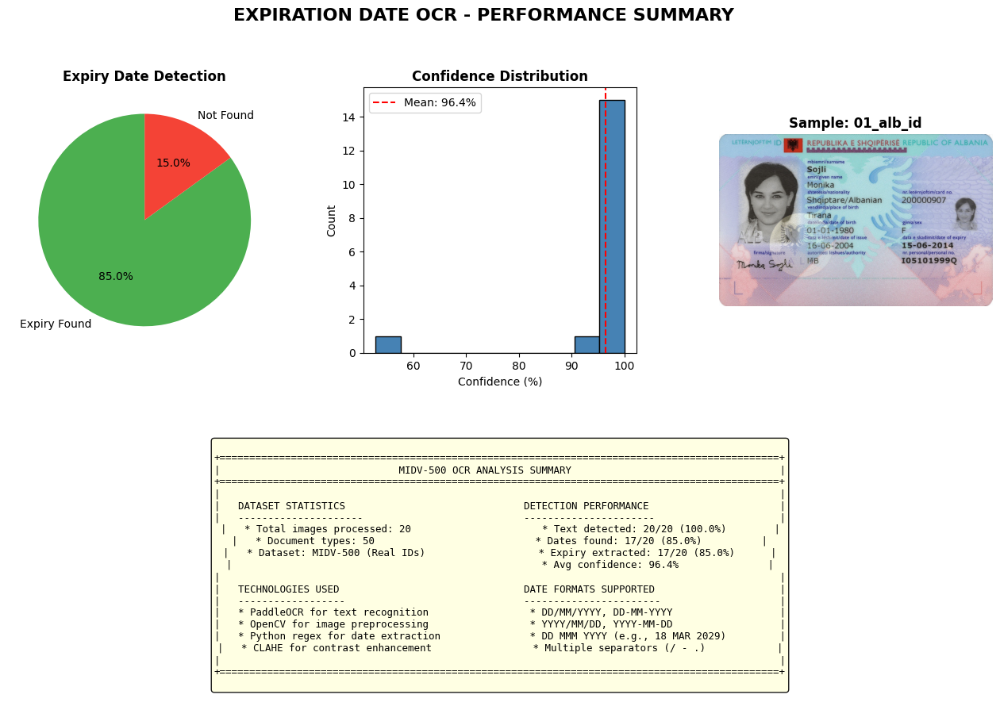


Summary saved to 'ocr_performance_summary.png'


In [19]:
# Calculate overall statistics
total_images = len(all_results)
images_with_text = sum(1 for r in all_results if r['all_text'])
images_with_dates = sum(1 for r in all_results if r['all_dates'])
images_with_expiry = sum(1 for r in all_results if r['expiry_date'])

all_confidences = [r['expiry_confidence'] for r in all_results if r['expiry_date']]
avg_confidence = np.mean(all_confidences) * 100 if all_confidences else 0

# Create summary visualization
fig = plt.figure(figsize=(16, 10))
fig.suptitle('EXPIRATION DATE OCR - PERFORMANCE SUMMARY', fontsize=16, fontweight='bold')

gs = fig.add_gridspec(2, 3, hspace=0.3, wspace=0.3)

# 1. Detection rates pie chart
ax1 = fig.add_subplot(gs[0, 0])
if images_with_expiry > 0:
    sizes = [images_with_expiry, total_images - images_with_expiry]
    labels = ['Expiry Found', 'Not Found']
    colors = ['#4CAF50', '#f44336']
    ax1.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
else:
    ax1.text(0.5, 0.5, 'No expiry dates\ndetected', ha='center', va='center', fontsize=12)
ax1.set_title('Expiry Date Detection', fontweight='bold')

# 2. Confidence distribution
ax2 = fig.add_subplot(gs[0, 1])
if all_confidences:
    ax2.hist([c*100 for c in all_confidences], bins=10, color='steelblue', edgecolor='black')
    ax2.axvline(avg_confidence, color='red', linestyle='--', label=f'Mean: {avg_confidence:.1f}%')
    ax2.legend()
else:
    ax2.text(0.5, 0.5, 'No confidence\ndata available', ha='center', va='center', fontsize=12)
ax2.set_xlabel('Confidence (%)')
ax2.set_ylabel('Count')
ax2.set_title('Confidence Distribution', fontweight='bold')

# 3. Sample image
ax3 = fig.add_subplot(gs[0, 2])
if dataset_images:
    sample_img = cv2.cvtColor(dataset_images[0]['image'], cv2.COLOR_BGR2RGB)
    ax3.imshow(sample_img)
    ax3.set_title(f"Sample: {dataset_images[0]['name']}", fontweight='bold')
ax3.axis('off')

# 4. Statistics summary
ax4 = fig.add_subplot(gs[1, :])
ax4.axis('off')

summary_text = f"""
+==============================================================================================+
|                              MIDV-500 OCR ANALYSIS SUMMARY                                   |
+==============================================================================================+
|                                                                                              |
|   DATASET STATISTICS                              DETECTION PERFORMANCE                      |
|   ---------------------                           ----------------------                     |
|   * Total images processed: {total_images:<10}              * Text detected: {images_with_text}/{total_images} ({images_with_text/total_images*100:.1f}%)        |
|   * Document types: {len(document_types):<15}              * Dates found: {images_with_dates}/{total_images} ({images_with_dates/total_images*100:.1f}%)          |
|   * Dataset: MIDV-500 (Real IDs)                   * Expiry extracted: {images_with_expiry}/{total_images} ({images_with_expiry/total_images*100:.1f}%)      |
|                                                    * Avg confidence: {avg_confidence:.1f}%               |
|                                                                                              |
|   TECHNOLOGIES USED                               DATE FORMATS SUPPORTED                     |
|   ------------------                              -----------------------                    |
|   * PaddleOCR for text recognition                 * DD/MM/YYYY, DD-MM-YYYY                  |
|   * OpenCV for image preprocessing                 * YYYY/MM/DD, YYYY-MM-DD                  |
|   * Python regex for date extraction               * DD MMM YYYY (e.g., 18 MAR 2029)         |
|   * CLAHE for contrast enhancement                 * Multiple separators (/ - .)            |
|                                                                                              |
+==============================================================================================+
"""

ax4.text(0.5, 0.5, summary_text, transform=ax4.transAxes, fontsize=9,
         verticalalignment='center', horizontalalignment='center',
         fontfamily='monospace', bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))

plt.tight_layout()
plt.savefig('ocr_performance_summary.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nSummary saved to 'ocr_performance_summary.png'")

## 11. Conclusions

### Summary

This project successfully implemented an **Expiration Date Recognition System** using:

1. **Real Dataset**: MIDV-500 with actual ID card images
2. **PaddleOCR**: State-of-the-art multilingual text recognition
3. **Smart Date Extraction**: Context-aware expiry date detection

### Key Features

- **Real ID card images** from MIDV-500 dataset
- Multi-format date support (DD/MM/YYYY, YYYY-MM-DD, DD MMM YYYY)
- Multilingual support (English, French, German, Spanish)
- Robust preprocessing pipeline (CLAHE, denoising)
- Context-aware expiry detection (keywords in multiple languages)
- Expiry validation and days remaining calculation

### Supported Document Types

- National ID Cards (17 types)
- Passports (14 types)
- Driving Licenses (13 types)
- Other identity documents (6 types)


In [21]:
print("\n" + "=" * 60)
print("PROJECT COMPLETE!")
print("=" * 60)
print(f"""
Final Statistics:
   * Images Processed: {total_images}
   * Document Types: {len(document_types)}
   * Text Detection Rate: {images_with_text/total_images*100:.1f}%
   * Date Detection Rate: {images_with_dates/total_images*100:.1f}%
   * Expiry Extraction Rate: {images_with_expiry/total_images*100:.1f}%
   * Average Confidence: {avg_confidence:.1f}%

Generated Files:
   * ocr_performance_summary.png
   * MIDV-500 dataset in data/midv500/

Technologies Used:
   * PaddleOCR - Text detection & recognition
   * OpenCV - Image preprocessing
   * MIDV-500 - Real ID card dataset
""")


PROJECT COMPLETE!

Final Statistics:
   * Images Processed: 20
   * Document Types: 50
   * Text Detection Rate: 100.0%
   * Date Detection Rate: 85.0%
   * Expiry Extraction Rate: 85.0%
   * Average Confidence: 96.4%

Generated Files:
   * ocr_performance_summary.png
   * MIDV-500 dataset in data/midv500/

Technologies Used:
   * PaddleOCR - Text detection & recognition
   * OpenCV - Image preprocessing
   * MIDV-500 - Real ID card dataset

